## Exploratory Data Analysis

In [55]:
#importing all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import skew, kurtosis

### Data Overview

This section provides a basic overview of the dataset, including the number of rows, columns, and data types. We also check for missing values and explore descriptive statistics to understand the distribution and scale of features.


In [56]:
df = pd.read_csv('combined_mhealth_data.csv')

In [58]:
df.shape

(343195, 24)

In [59]:
activity_counts = df['label'].value_counts()
activity_counts

label
5     30720
1     30720
2     30720
3     30720
4     30720
9     30720
10    30720
11    30720
7     29441
8     29337
6     28315
12    10342
Name: count, dtype: int64

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343195 entries, 0 to 343194
Data columns (total 24 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   acc_chest_x     343195 non-null  float64
 1   acc_chest_y     343195 non-null  float64
 2   acc_chest_z     343195 non-null  float64
 3   ecg_1           343195 non-null  float64
 4   ecg_2           343195 non-null  float64
 5   acc_ankle_x     343195 non-null  float64
 6   acc_ankle_y     343195 non-null  float64
 7   acc_ankle_z     343195 non-null  float64
 8   gyro_ankle_x    343195 non-null  float64
 9   gyro_ankle_y    343195 non-null  float64
 10  gyro_ankle_z    343195 non-null  float64
 11  magnet_ankle_x  343195 non-null  float64
 12  magnet_ankle_y  343195 non-null  float64
 13  magnet_ankle_z  343195 non-null  float64
 14  acc_arm_x       343195 non-null  float64
 15  acc_arm_y       343195 non-null  float64
 16  acc_arm_z       343195 non-null  float64
 17  gyro_arm_x

In [61]:
df.describe()

,acc_chest_x,acc_chest_y,acc_chest_z,ecg_1,ecg_2,acc_ankle_x,acc_ankle_y,acc_ankle_z,gyro_ankle_x,gyro_ankle_y,...,acc_arm_x,acc_arm_y,acc_arm_z,gyro_arm_x,gyro_arm_y,gyro_arm_z,magnet_arm_x,magnet_arm_y,magnet_arm_z,label
count,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,...,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000,343195.000000
mean,-7.485271,-0.140923,-0.938418,0.003649,-0.008048,1.805184,-9.061487,-0.701985,0.101167,-0.549942,...,-3.448201,-5.781446,2.381165,-0.201574,-0.410515,0.380693,-0.532629,1.422140,0.030670,6.169021
std,5.701949,2.799380,4.611164,0.839074,0.857724,4.214175,5.200389,6.457622,0.458913,0.434721,...,5.891595,6.578371,4.177971,0.549524,0.546359,0.515658,34.216257,30.285262,82.663004,3.298902
min,-22.438000,-20.188000,-18.401000,-8.619600,-8.619600,-22.146000,-19.619000,-19.373000,-1.779200,-2.660400,...,-22.345000,-18.972000,-18.238000,-1.170600,-2.256700,-1.114200,-319.030000,-358.130000,-702.570000,1.000000
25%,-9.707100,-1.294300,-3.686550,-0.213500,-0.171640,0.159875,-10.063000,-3.494350,-0.345080,-0.810510,...,-5.013900,-9.558100,0.139070,-0.682350,-0.831620,-0.040948,-6.228350,-7.272000,-12.170000,3.000000
50%,-8.800300,-0.292570,-0.881070,-0.071167,-0.046049,1.372500,-9.597700,0.340070,0.204080,-0.688560,...,-2.480000,-7.738900,1.819100,-0.300000,-0.597540,0.448280,0.360740,0.353930,-0.709300,6.000000
75%,-5.117400,0.984775,1.092650,0.163270,0.138150,2.924450,-7.549800,1.819300,0.487940,-0.487800,...,-0.539050,-2.359550,5.324750,0.278430,-0.045175,0.840520,5.224000,8.350250,10.302500,9.000000
max,19.094000,20.927000,26.196000,8.506500,8.519100,20.024000,21.161000,25.015000,1.710600,1.752300,...,19.801000,21.965000,25.741000,1.415700,1.121100,1.528000,239.690000,335.250000,657.180000,12.000000


In [62]:
df.isnull().sum()

acc_chest_x       0
acc_chest_y       0
acc_chest_z       0
ecg_1             0
ecg_2             0
acc_ankle_x       0
acc_ankle_y       0
acc_ankle_z       0
gyro_ankle_x      0
gyro_ankle_y      0
gyro_ankle_z      0
magnet_ankle_x    0
magnet_ankle_y    0
magnet_ankle_z    0
acc_arm_x         0
acc_arm_y         0
acc_arm_z         0
gyro_arm_x        0
gyro_arm_y        0
gyro_arm_z        0
magnet_arm_x      0
magnet_arm_y      0
magnet_arm_z      0
label             0
dtype: int64

In [63]:
df.duplicated().sum()

0

### Label Distribution

We visualize how the target variable (`label`) is distributed. This helps identify any imbalance in class frequencies, which may impact model performance.


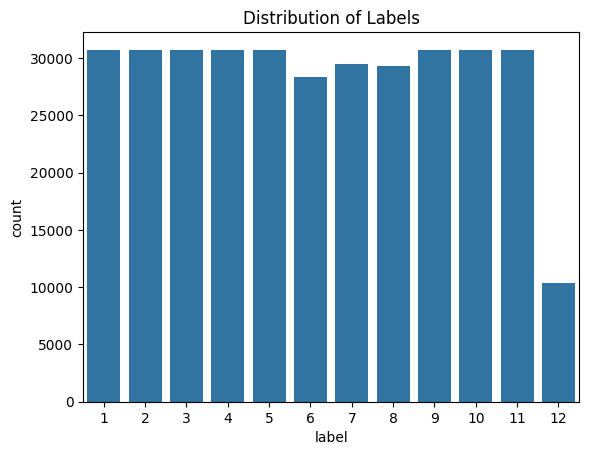

In [64]:
sns.countplot(x='label', data=df)
plt.title("Distribution of Labels")
plt.show()

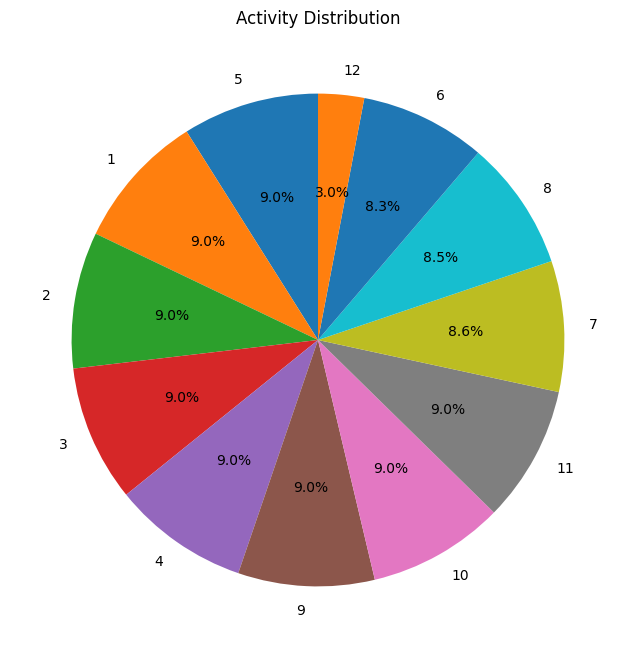

In [65]:
plt.figure(figsize=(8, 8))  
plt.pie(activity_counts, labels=activity_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Activity Distribution') 
plt.show()

### Correlation Heatmap

This heatmap shows the correlation between features. It helps identify multicollinearity, groups of similar signals, and which features are closely related.



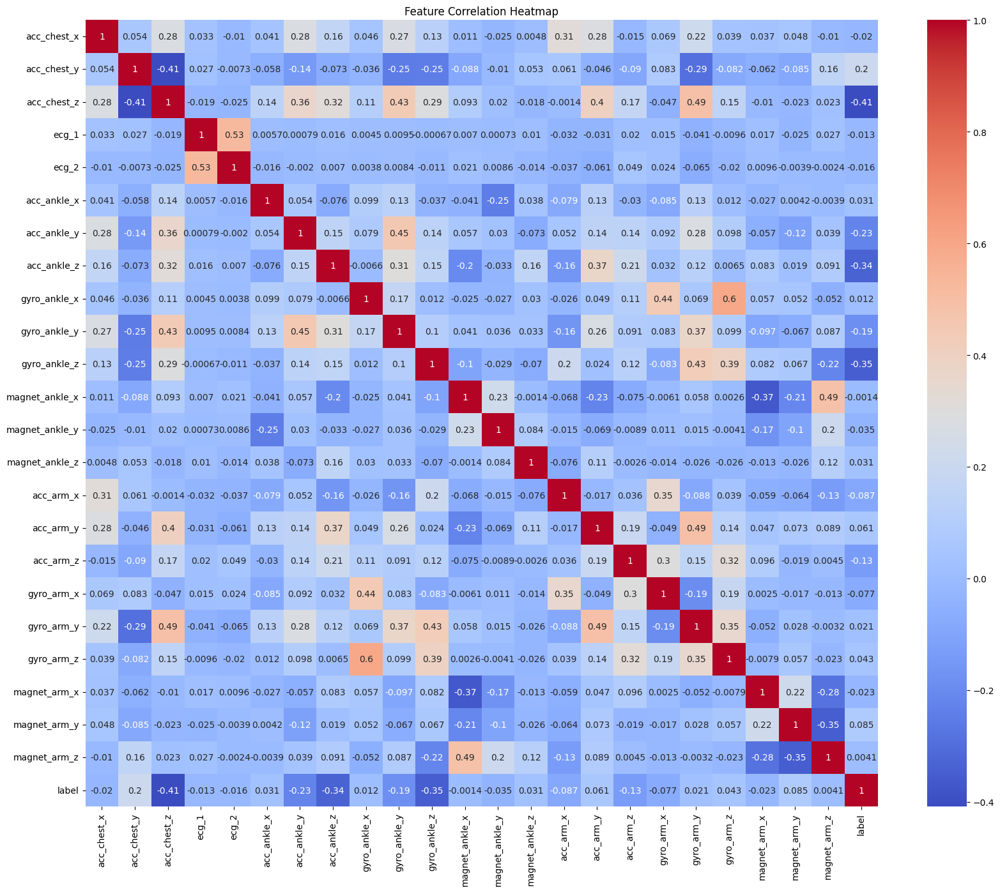

In [14]:
plt.figure(figsize=(20, 16))
sns.heatmap(corr, cmap='coolwarm', annot=True)
plt.title("Feature Correlation Heatmap")
plt.show()

### Histplot of Selected Features

This plot visualizes pairwise relationships between a few selected features, colored by label. It's useful for spotting clusters and separability between classes.



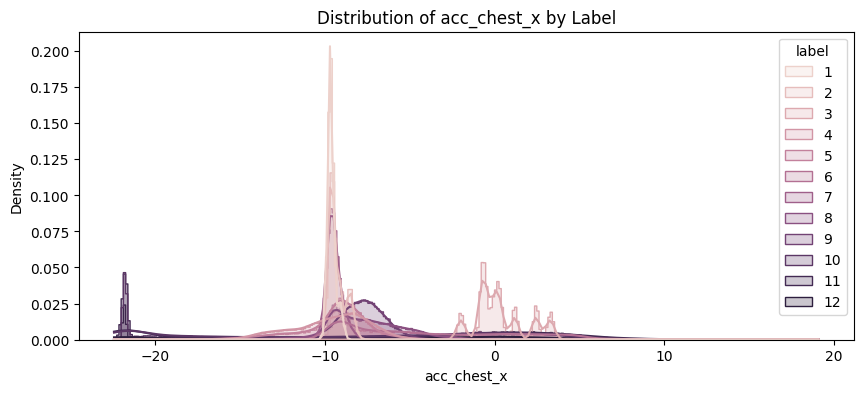

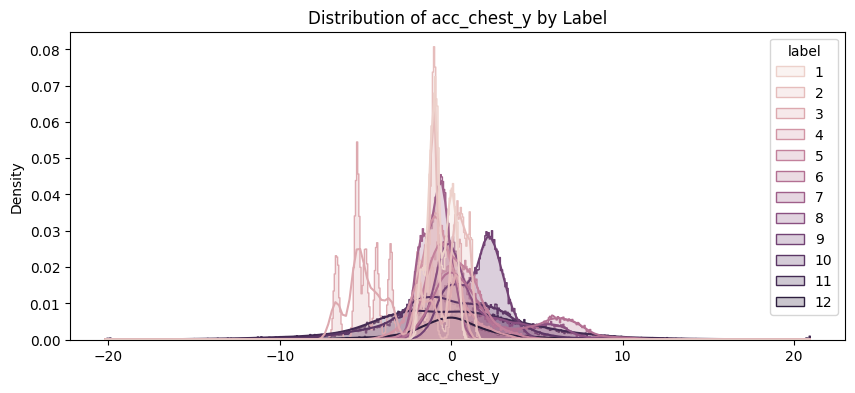

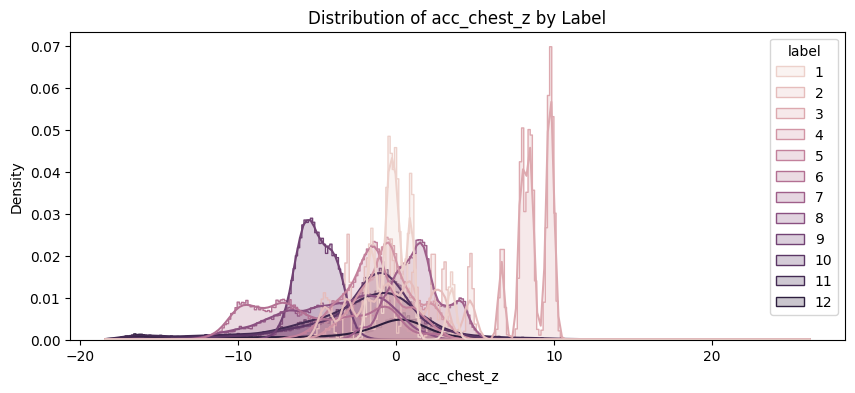

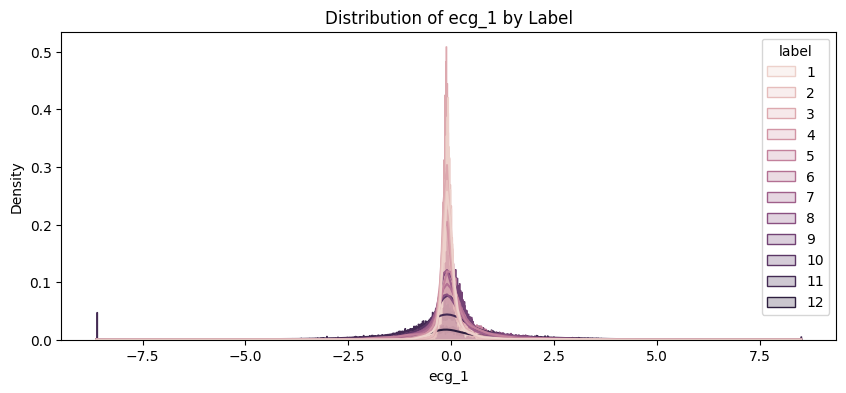

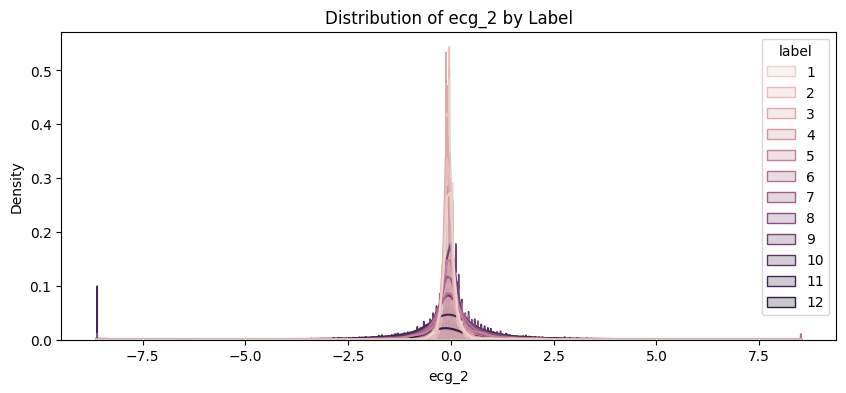

...

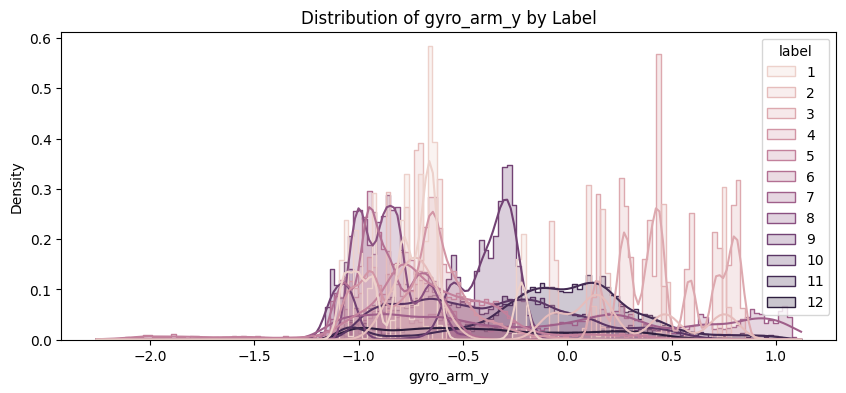

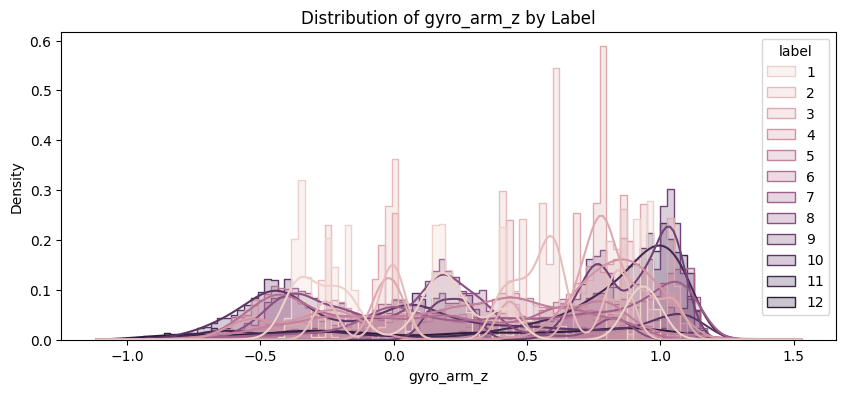

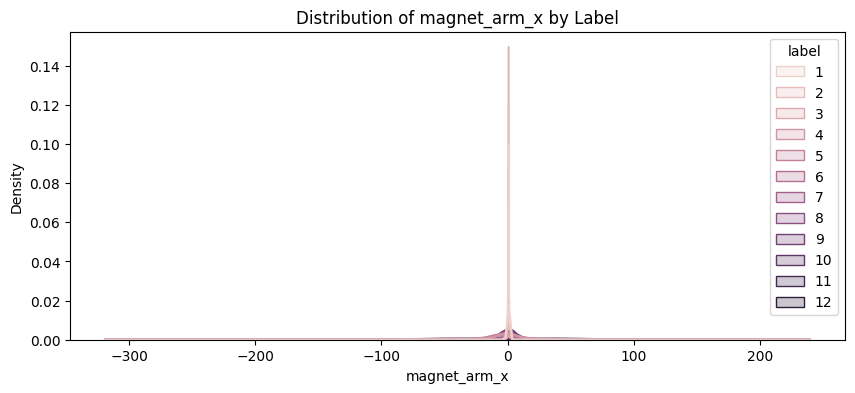

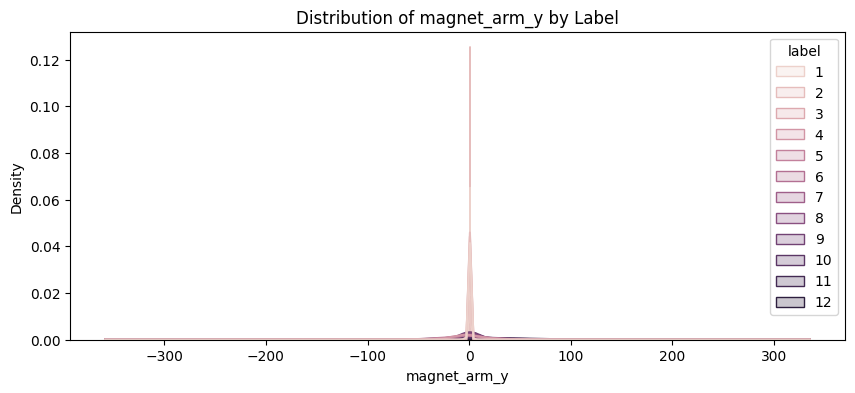

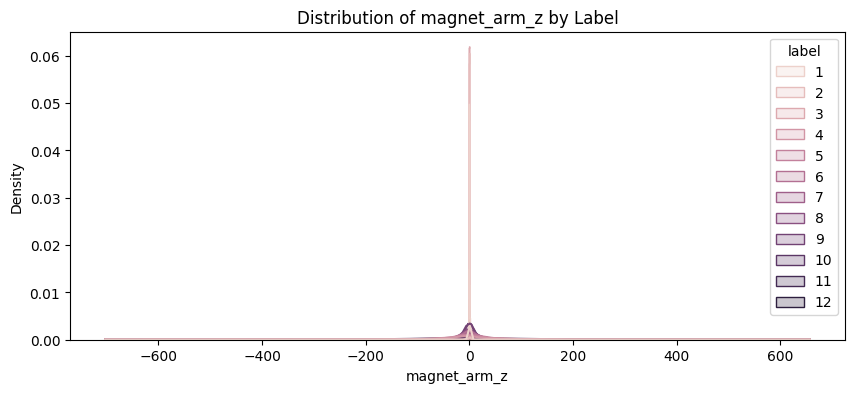

In [21]:
column=df.columns
features_to_plot = column[0:(len(column)-1)]

for feature in features_to_plot:
    plt.figure(figsize=(10, 4))
    sns.histplot(data=df, x=feature, hue='label', kde=True, element='step', stat='density')
    plt.title(f'Distribution of {feature} by Label')
    plt.show()

### Dimensionality Reduction with PCA

Principal Component Analysis (PCA) is a technique used to reduce the dimensionality of the dataset while preserving as much variance as possible.

In this section:
- We apply PCA on the sensor features (excluding the label).
- Visualize the data in 2D and/or 3D space using the top principal components.
- Color points by label to observe how well PCA separates different activity classes.

This helps understand the intrinsic structure of the data and whether the classes form natural clusters.



C:\Users\MACHINE\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


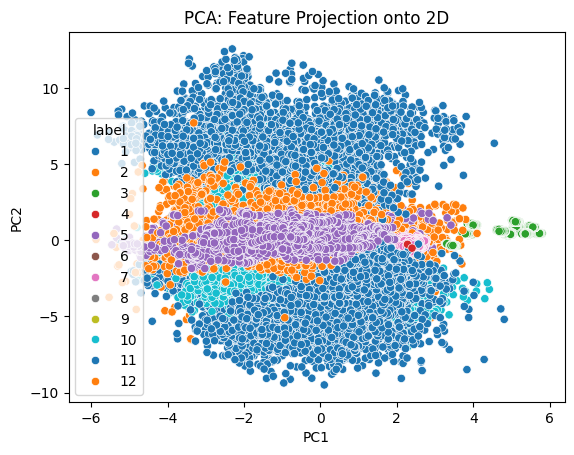

In [66]:
# Standardize data
X = df.drop(columns=['label'])
X_scaled = StandardScaler().fit_transform(X)

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Plot
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['label'] = df['label']

sns.scatterplot(x='PC1', y='PC2', hue='label', data=pca_df, palette='tab10')
plt.title("PCA: Feature Projection onto 2D")
plt.show()

### Time Series Visualization of Sensor Signals

This plot shows how sensor values change over time by visualizing the first 1000 samples of the chest accelerometer axes (`acc_chest_x`, `acc_chest_y`, `acc_chest_z`).

This kind of visualization is useful for:

- Understanding signal fluctuations and periodicity.
- Identifying noise, spikes, or drifts in sensor measurements.
- Comparing the behavior of different sensor axes over the same time window.

It's especially helpful in time-series or sequence modeling tasks such as activity recognition using wearable sensor data.


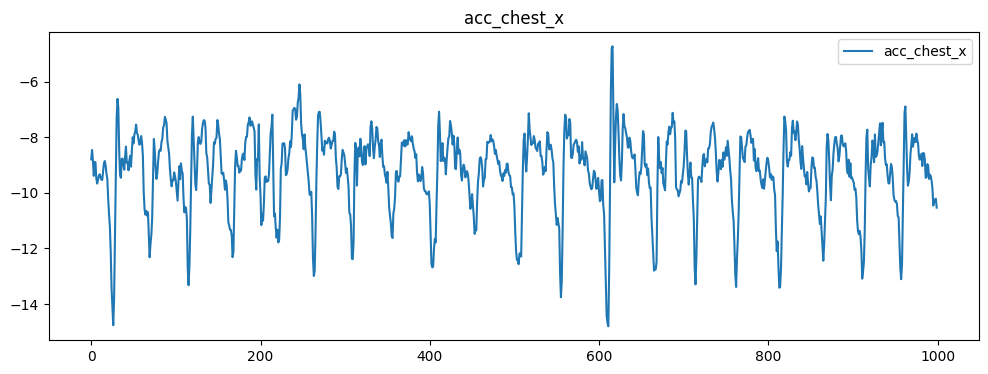

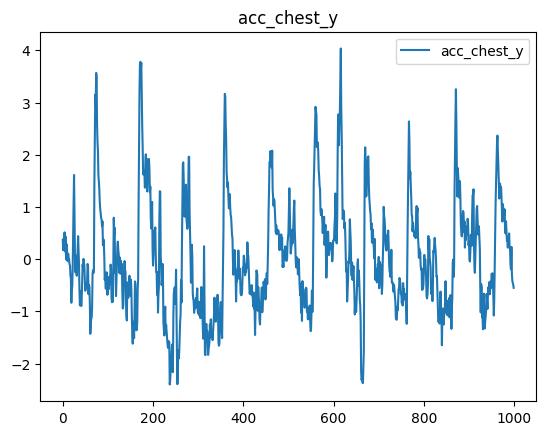

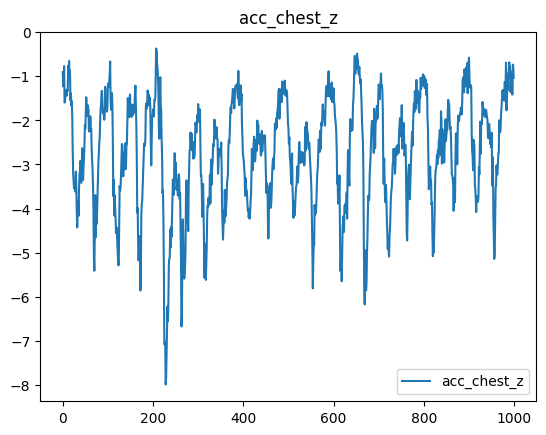

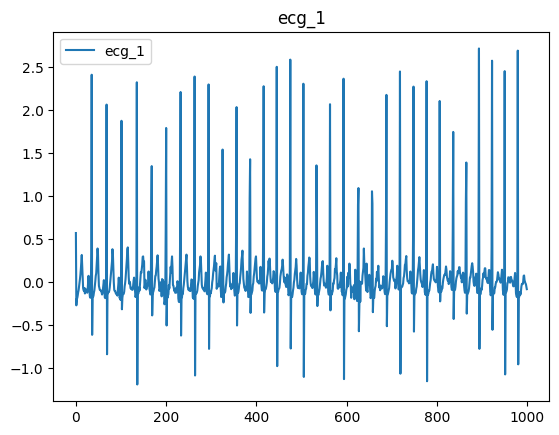

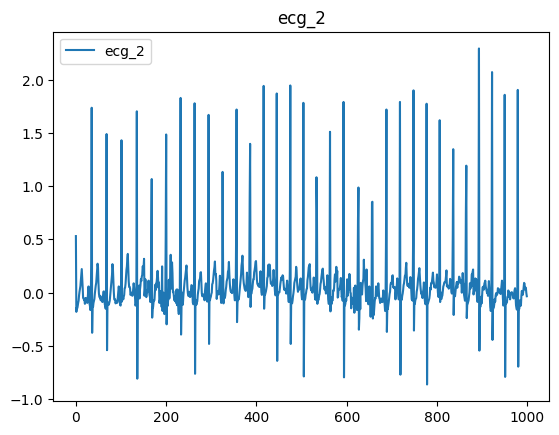

...

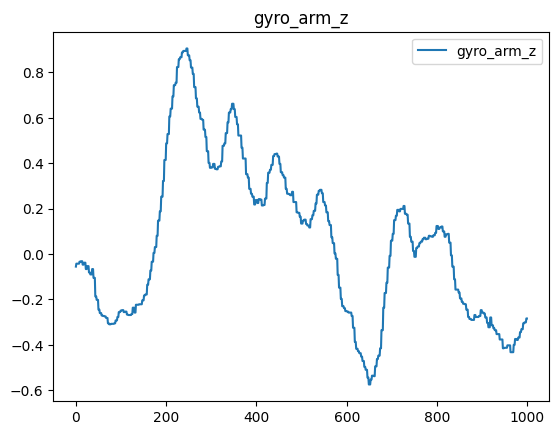

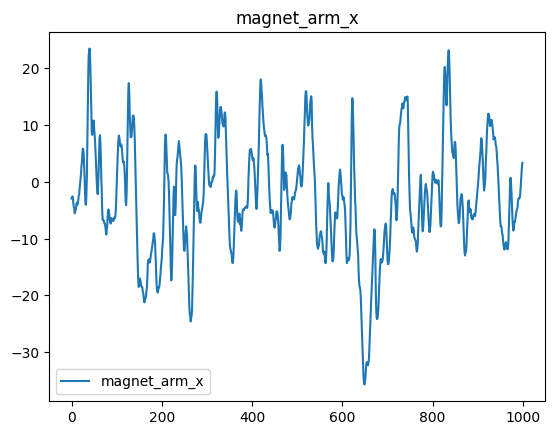

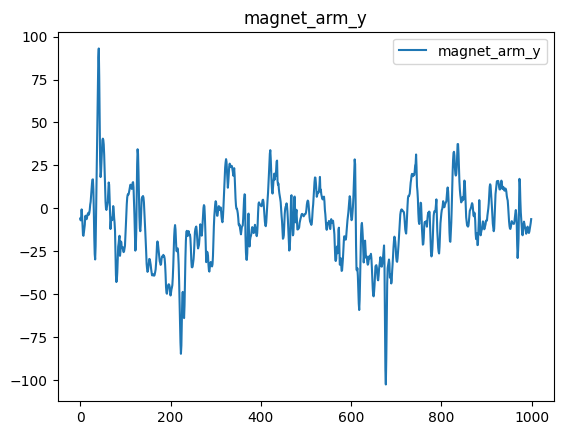

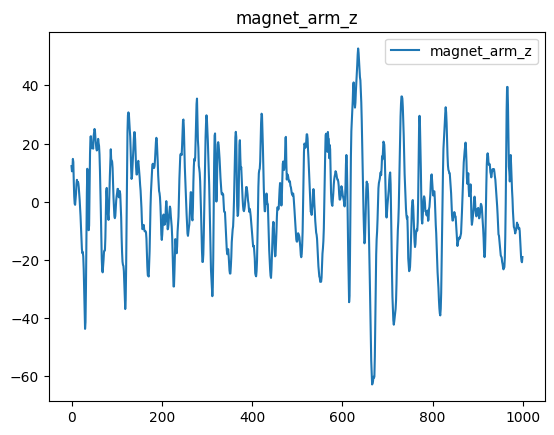

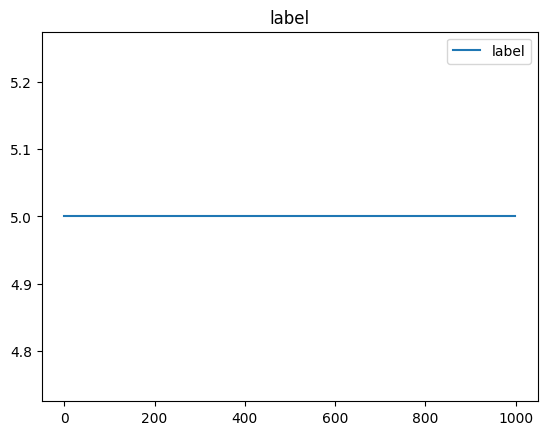

In [67]:
plt.figure(figsize=(12, 4))
for i in column:
    plt.plot(df[i][:1000], label=i)
    plt.title(i)
    plt.legend()
    plt.show()

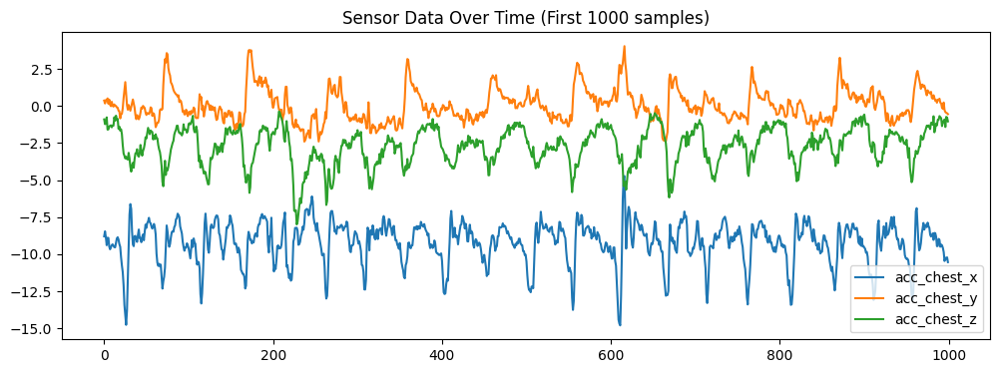

In [68]:
plt.figure(figsize=(12, 4))
plt.plot(df['acc_chest_x'][:1000], label='acc_chest_x')
plt.plot(df['acc_chest_y'][:1000], label='acc_chest_y')
plt.plot(df['acc_chest_z'][:1000], label='acc_chest_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

In [69]:
column

Index(['acc_chest_x', 'acc_chest_y', 'acc_chest_z', 'ecg_1', 'ecg_2',
       'acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z', 'gyro_ankle_x',
       'gyro_ankle_y', 'gyro_ankle_z', 'magnet_ankle_x', 'magnet_ankle_y',
       'magnet_ankle_z', 'acc_arm_x', 'acc_arm_y', 'acc_arm_z', 'gyro_arm_x',
       'gyro_arm_y', 'gyro_arm_z', 'magnet_arm_x', 'magnet_arm_y',
       'magnet_arm_z', 'label'],
      dtype='object')

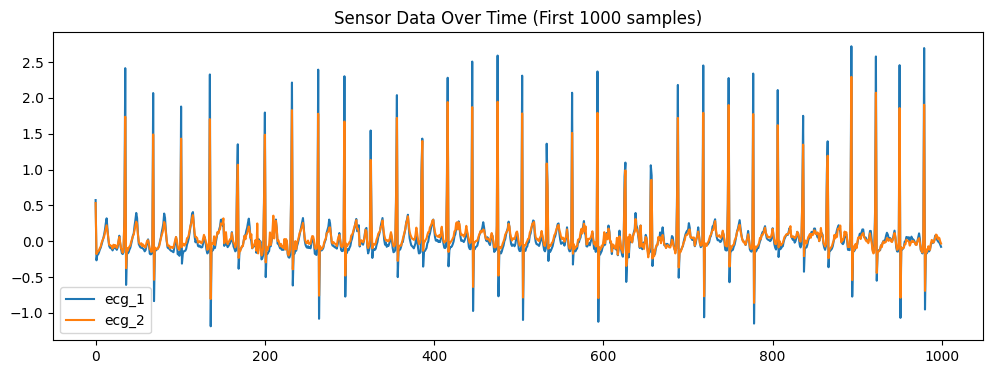

In [70]:
plt.figure(figsize=(12, 4))
plt.plot(df['ecg_1'][:1000], label='ecg_1')
plt.plot(df['ecg_2'][:1000], label='ecg_2')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

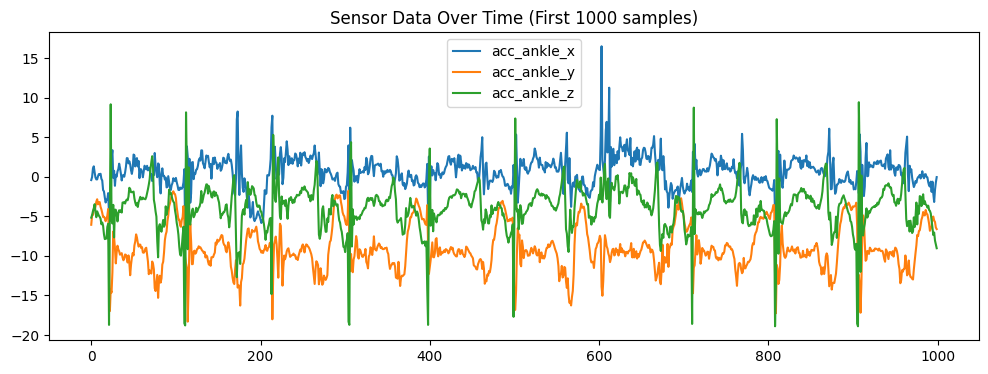

In [71]:
plt.figure(figsize=(12, 4))
plt.plot(df['acc_ankle_x'][:1000], label='acc_ankle_x')
plt.plot(df['acc_ankle_y'][:1000], label='acc_ankle_y')
plt.plot(df['acc_ankle_z'][:1000], label='acc_ankle_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

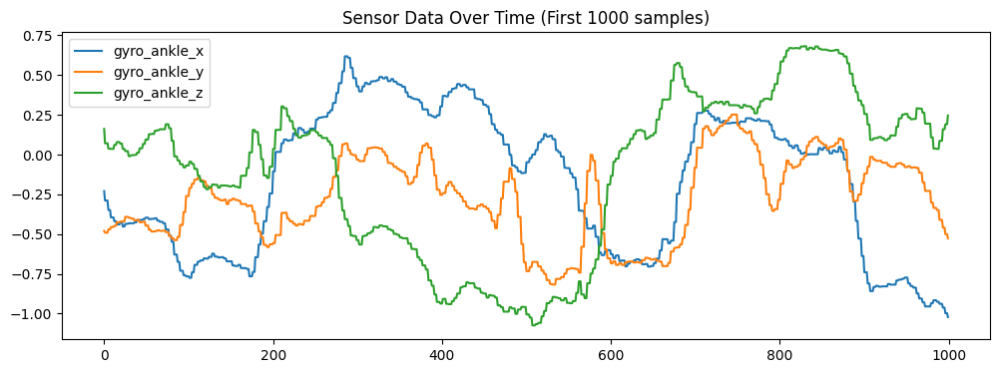

In [72]:
plt.figure(figsize=(12, 4))
plt.plot(df['gyro_ankle_x'][:1000], label='gyro_ankle_x')
plt.plot(df['gyro_ankle_y'][:1000], label='gyro_ankle_y')
plt.plot(df['gyro_ankle_z'][:1000], label='gyro_ankle_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

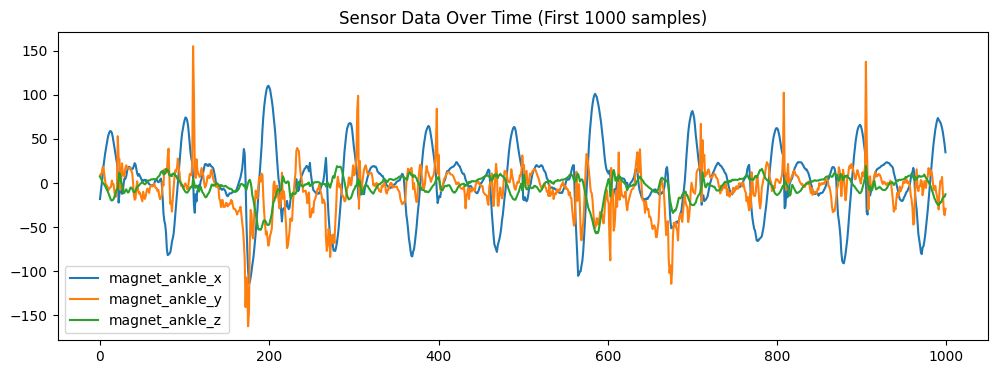

In [73]:
plt.figure(figsize=(12, 4))
plt.plot(df['magnet_ankle_x'][:1000], label='magnet_ankle_x')
plt.plot(df['magnet_ankle_y'][:1000], label='magnet_ankle_y')
plt.plot(df['magnet_ankle_z'][:1000], label='magnet_ankle_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

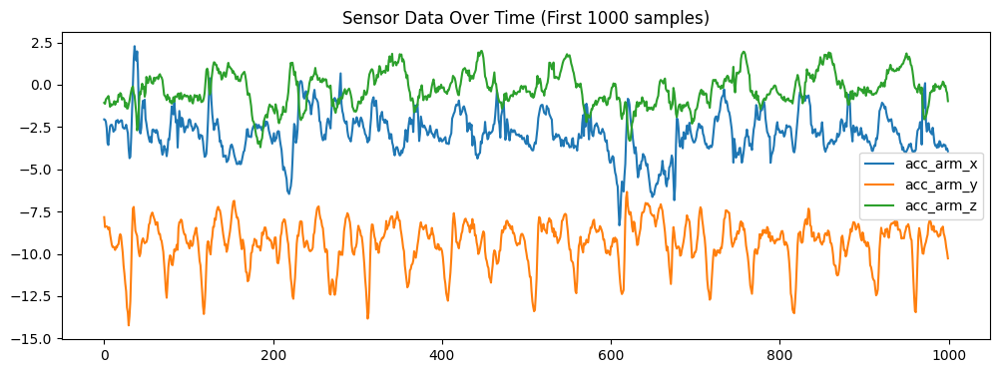

In [74]:
plt.figure(figsize=(12, 4))
plt.plot(df['acc_arm_x'][:1000], label='acc_arm_x')
plt.plot(df['acc_arm_y'][:1000], label='acc_arm_y')
plt.plot(df['acc_arm_z'][:1000], label='acc_arm_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

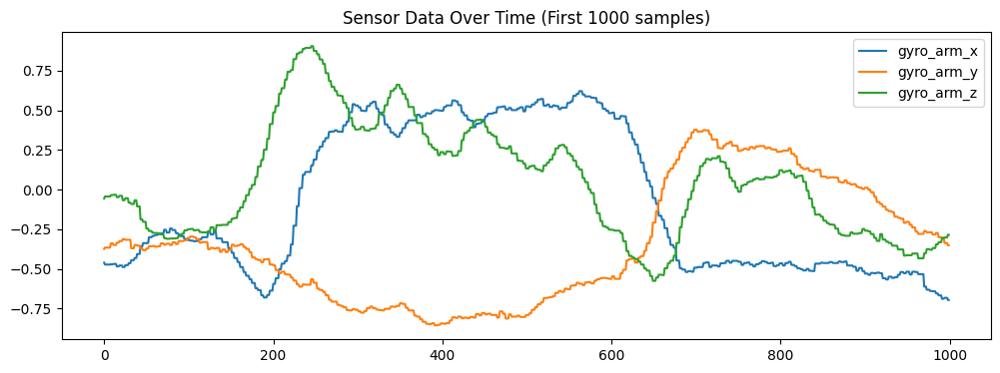

In [75]:
plt.figure(figsize=(12, 4))
plt.plot(df['gyro_arm_x'][:1000], label='gyro_arm_x')
plt.plot(df['gyro_arm_y'][:1000], label='gyro_arm_y')
plt.plot(df['gyro_arm_z'][:1000], label='gyro_arm_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

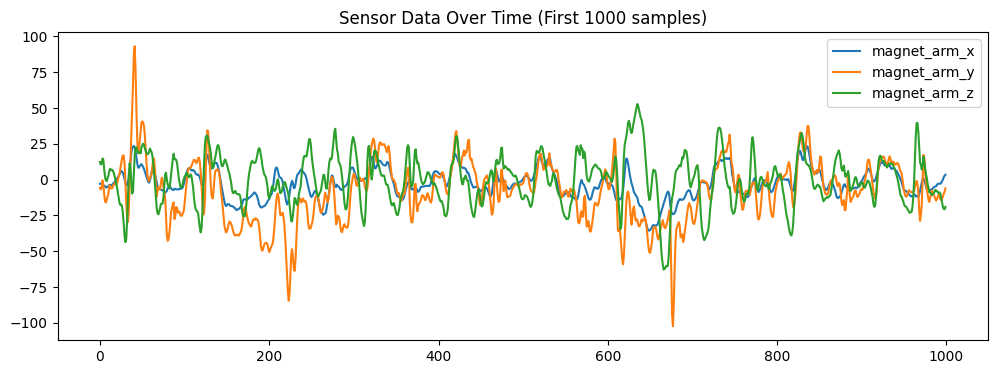

In [76]:
plt.figure(figsize=(12, 4))
plt.plot(df['magnet_arm_x'][:1000], label='magnet_arm_x')
plt.plot(df['magnet_arm_y'][:1000], label='magnet_arm_y')
plt.plot(df['magnet_arm_z'][:1000], label='magnet_arm_z')
plt.title("Sensor Data Over Time (First 1000 samples)")
plt.legend()
plt.show()

### Boxplots of Sensor Data by Label

We use boxplots to compare the distribution of each feature across different activity labels. This helps us observe how well features distinguish between classes.


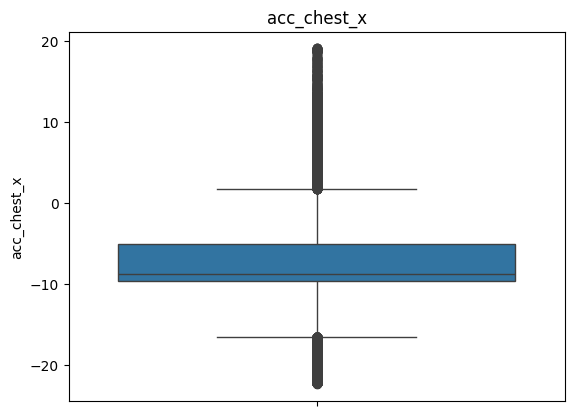

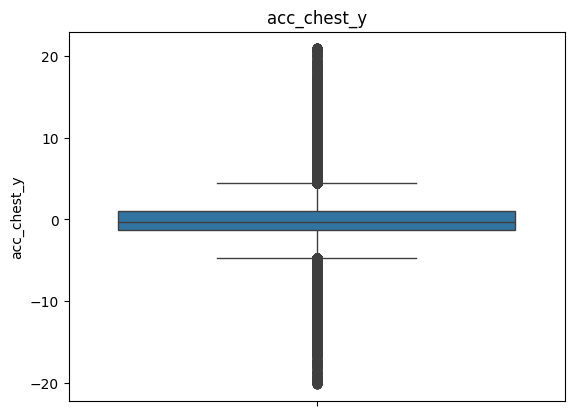

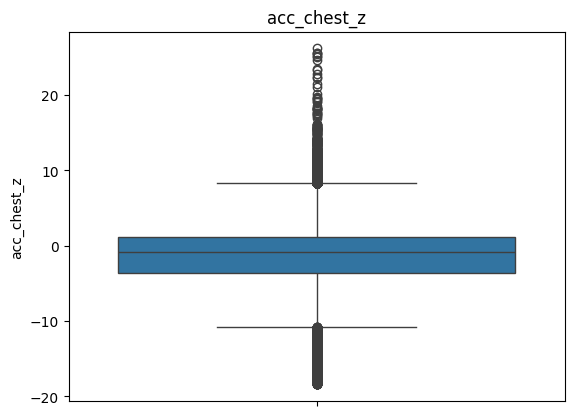

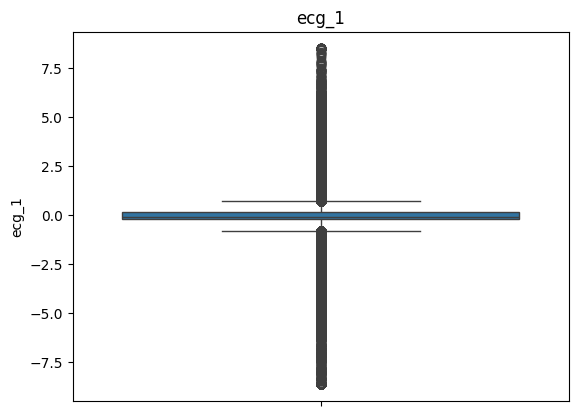

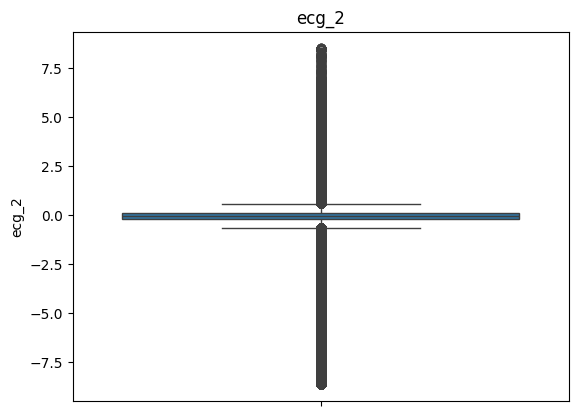

...

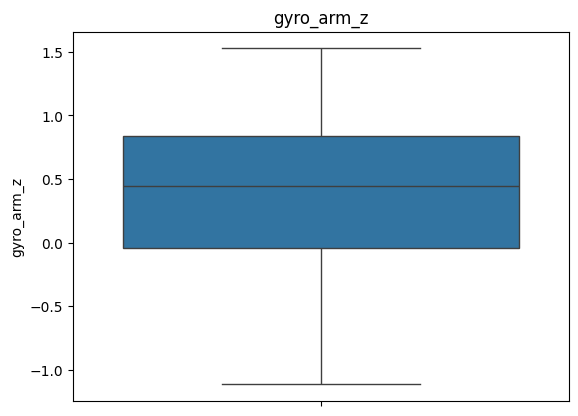

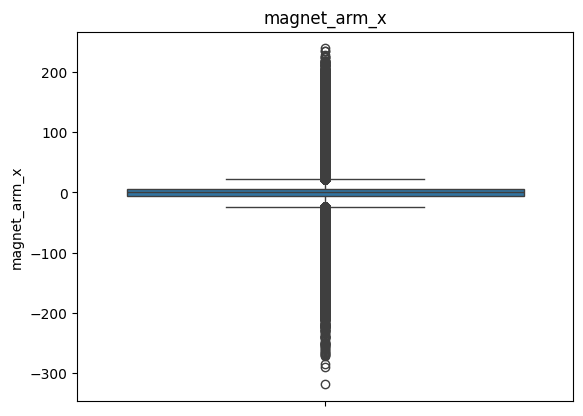

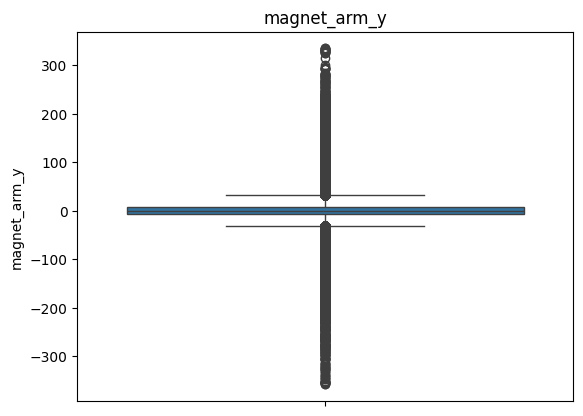

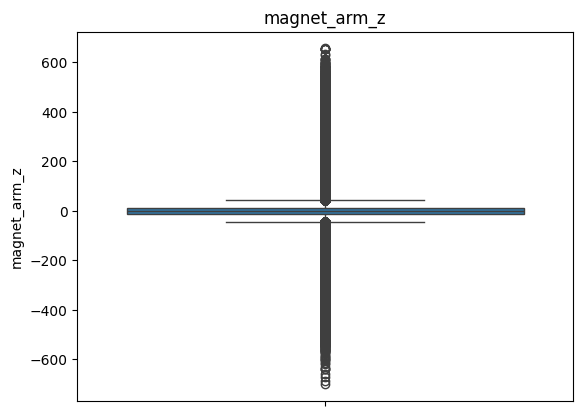

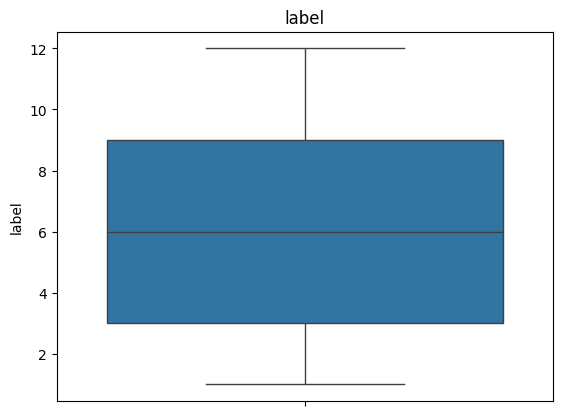

In [77]:
for i in column:
   sns.boxplot(data=df[i])
   plt.title(i)
   plt.show()

In [78]:
grouped_stats = df.groupby('label').agg(['mean', 'std'])
grouped_stats.head()  # Shows mean and std for each feature grouped by label

acc_chest_x           acc_chest_y           acc_chest_z            \
             mean       std        mean       std        mean       std   
label                                                                     
1       -9.613480  0.246040   -0.699418  0.660306    0.141333  1.394403   
2       -9.302898  0.482736   -0.313629  0.967972    0.103823  2.692884   
3        0.324193  1.500918   -3.317196  2.418779    8.702112  1.013831   
4       -9.598513  2.200504   -0.681049  1.308006   -0.419017  1.881440   
5       -9.394074  2.033463    0.116327  1.455419   -1.540936  1.943637   

          ecg_1               ecg_2            ... gyro_arm_y            \
           mean       std      mean       std  ...       mean       std   
label                                          ...                        
1      0.014754  0.463791 -0.000798  0.317936  ...  -0.746303  0.227104   
2     -0.014447  0.375106 -0.019601  0.257311  ...  -0.221811  0.551976   
3     -0.009116  0.399202 -0.021958  0.260651  ...   0.487398  0.221144   
4     -0.028083  0.448375 -0.018441  0.322290  ...  -0.708666  0.215116   
5      0.080803  0.815011  0.047782  0.609718  ...  -0.672247  0.409095   

      gyro_arm_z           magnet_arm_x            magnet_arm_y             \
            mean       std         mean        std         mean        std   
label                                                                        
1       0.172305  0.455742     0.355636   0.770587     0.344874   1.793016   
2       0.407203  0.355743     0.342290   0.392925     0.336243   0.514935   
3       0.625651  0.357040     0.343357   0.273684     0.335416   0.480554   
4       0.488101  0.558103    -0.037746  17.610420     0.175145  24.904918   
5       0.297499  0.439029    -2.607035  15.860561    -7.236899  26.953928   

      magnet_arm_z             
              mean        std  
label                          
1        -0.553059   1.128690  
2        -0.533885   0.632408  
3        -0.529319   0.514832  
4        -0.552588  68.086803  
5         2.011413  44.444077  

[5 rows x 46 columns]

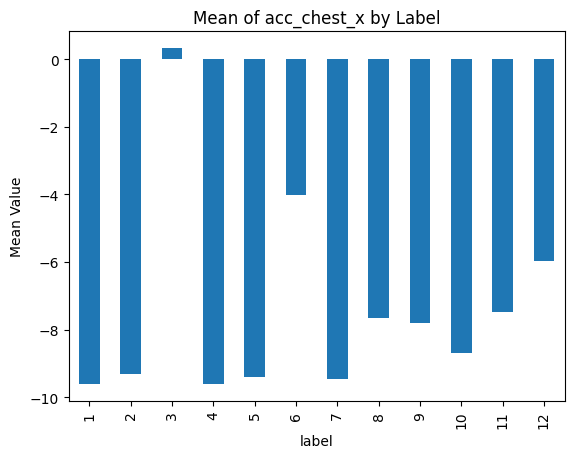

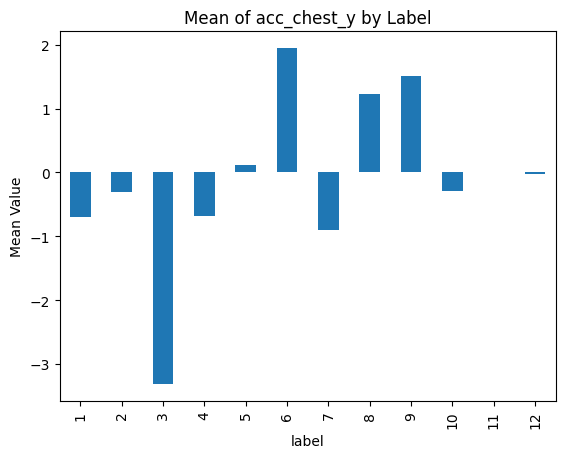

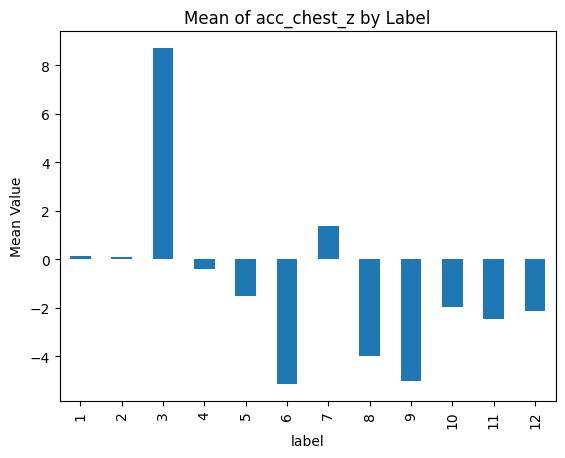

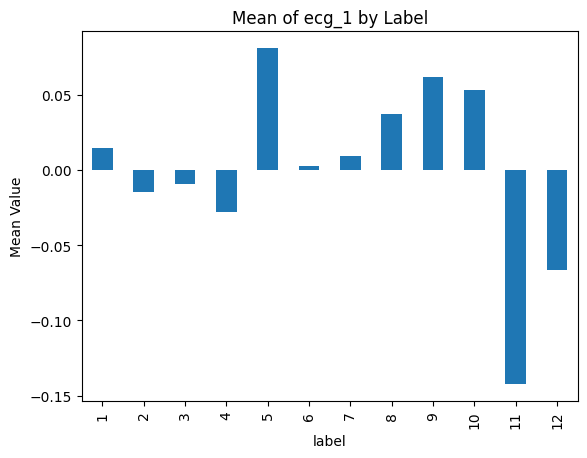

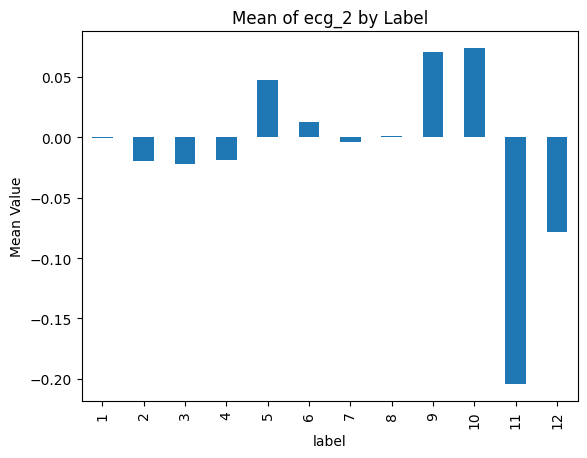

...

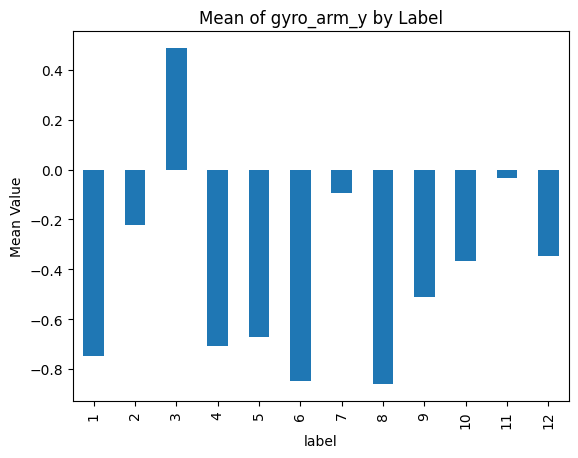

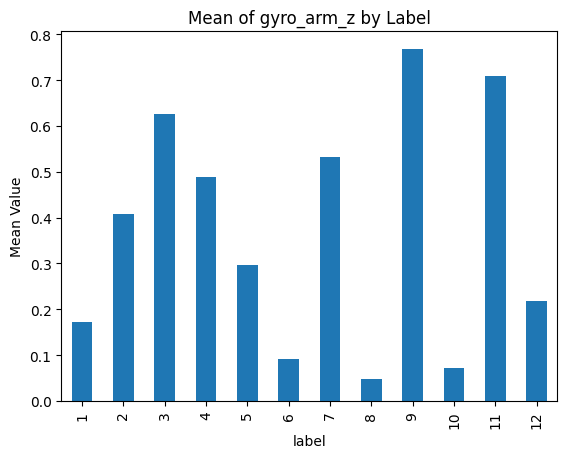

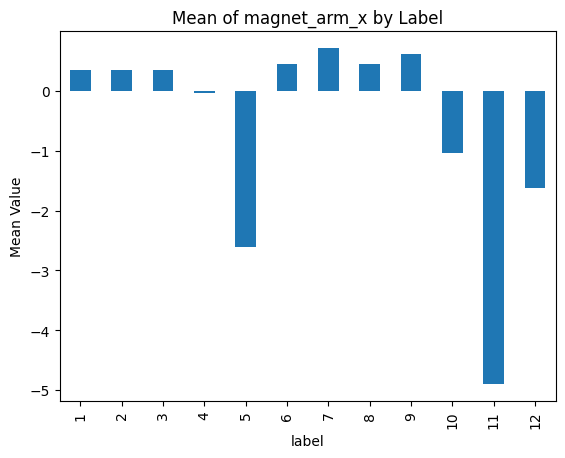

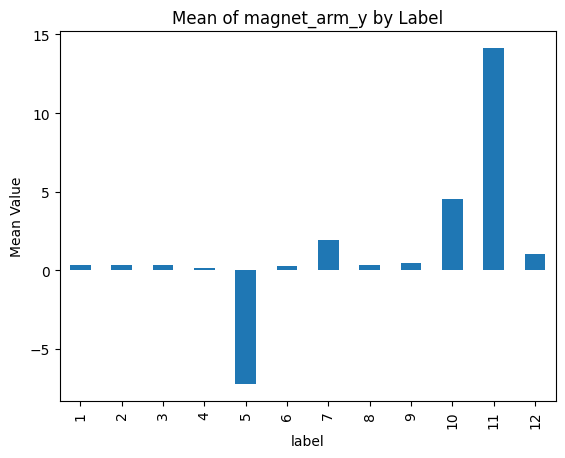

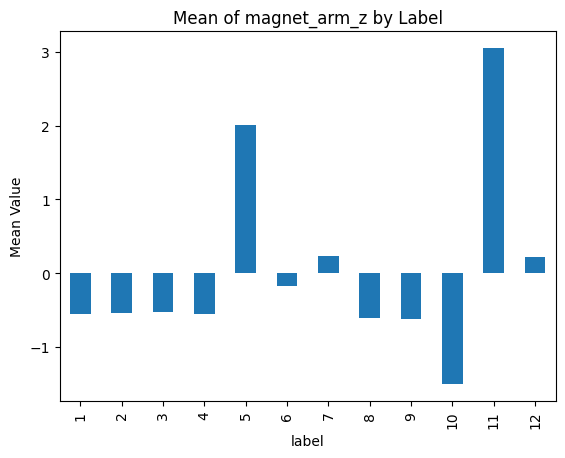

In [79]:
selected_features = column[0:(len(column)-1)]

for feature in selected_features:
    df.groupby('label')[feature].mean().plot(kind='bar', title=f'Mean of {feature} by Label')
    plt.ylabel('Mean Value')
    plt.show()


### Violin Plots

These violin plots show the density and spread of selected features for each label, combining the benefits of boxplots and KDE (Kernel Density Estimation).


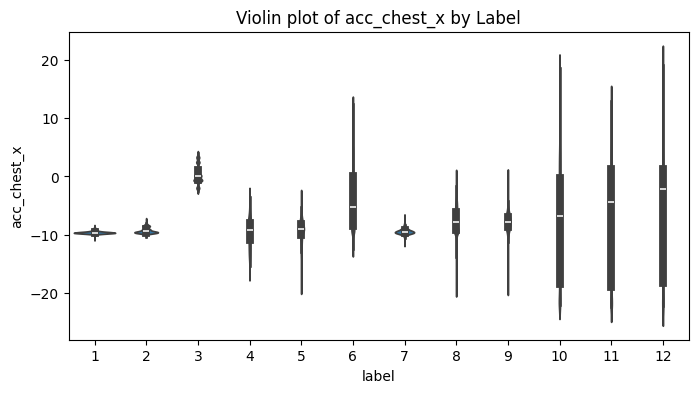

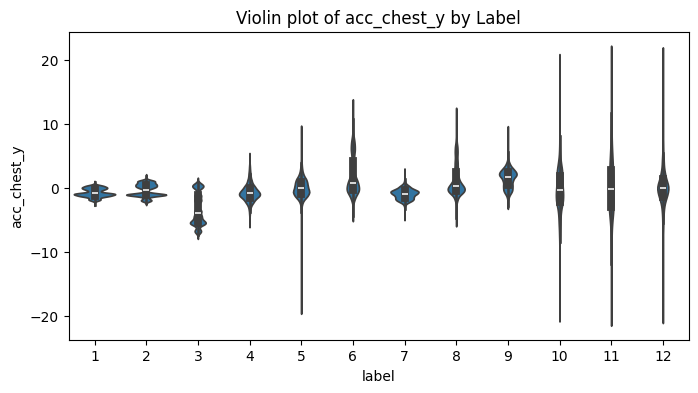

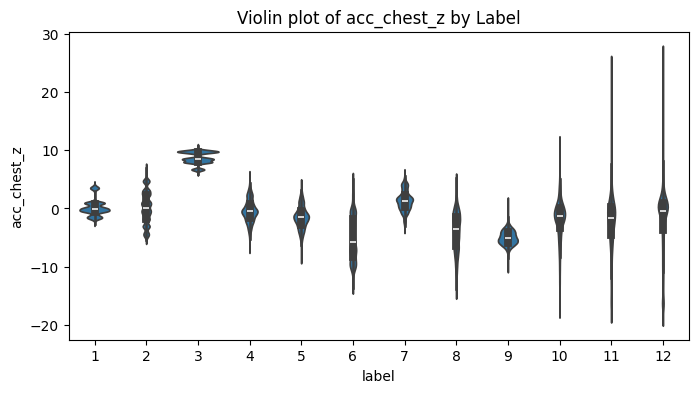

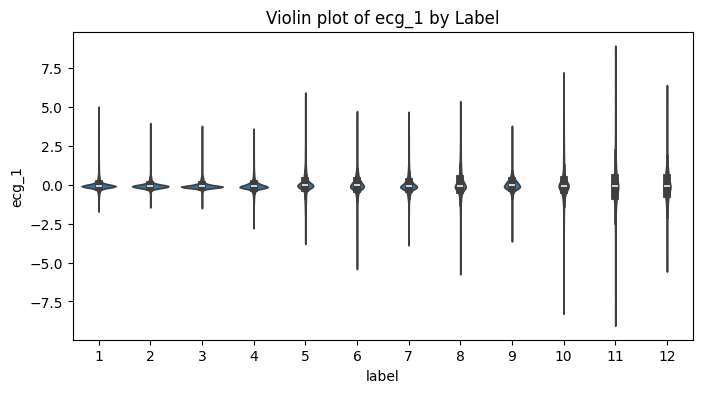

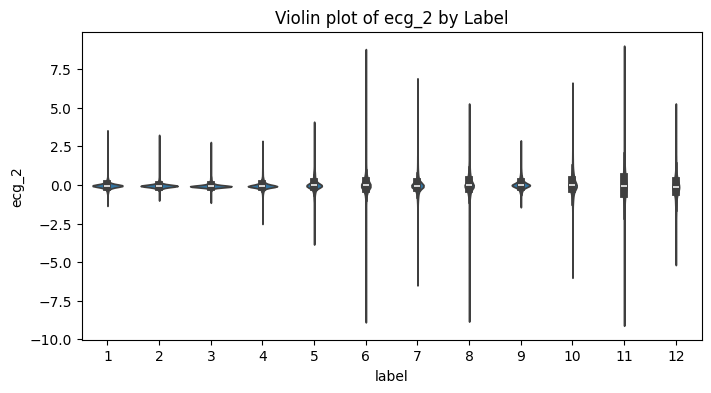

...

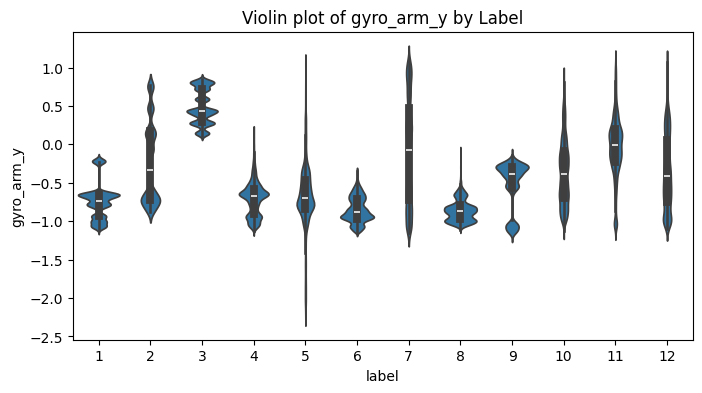

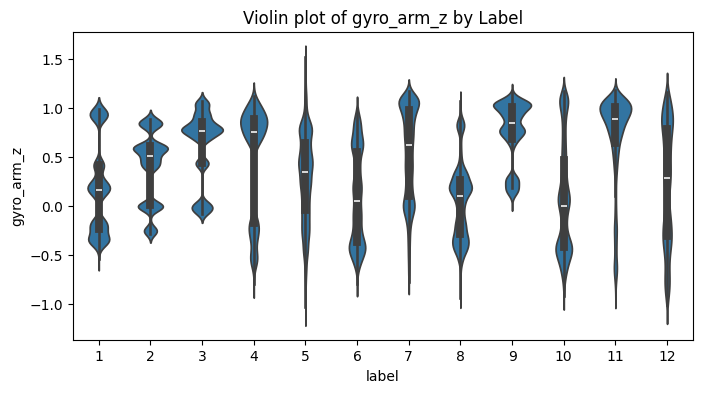

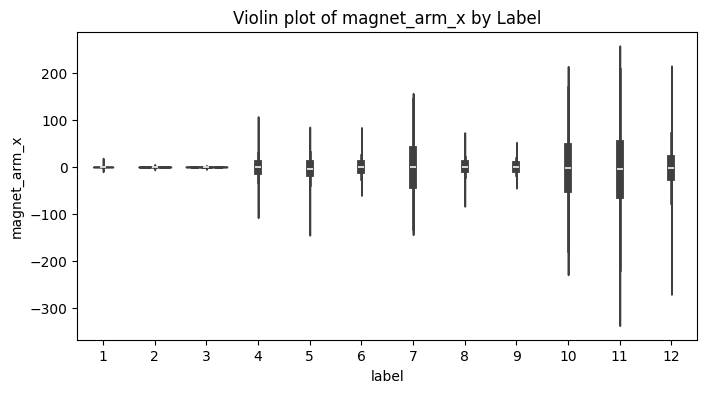

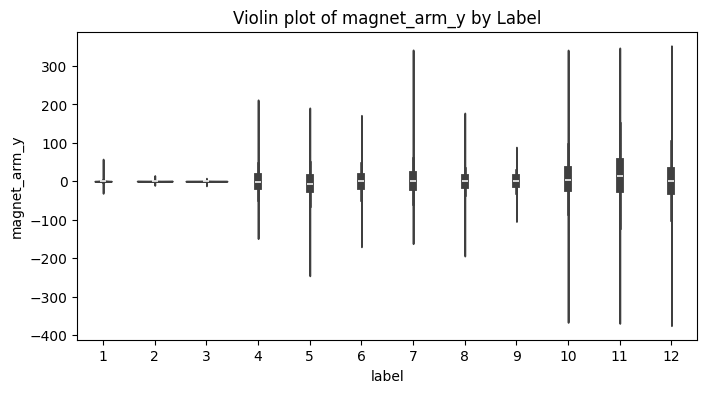

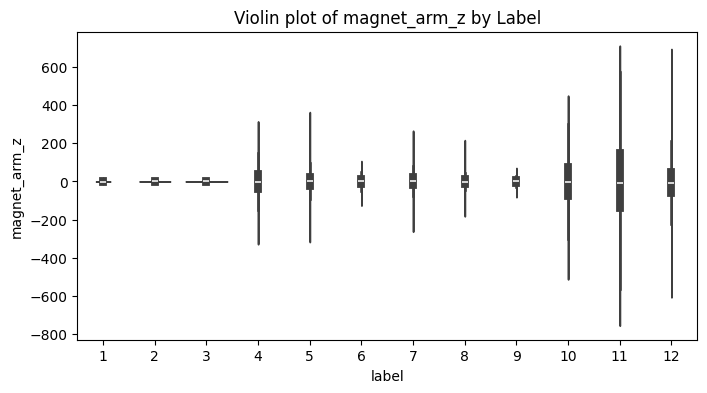

In [80]:
for feature in  column[0:(len(column)-1)]:
    plt.figure(figsize=(8, 4))
    sns.violinplot(x='label', y=feature, data=df)
    plt.title(f'Violin plot of {feature} by Label')
    plt.show()


### Signal Smoothing with Rolling Mean

Sensor data often contains high-frequency noise. We apply a rolling mean (window size = 50) to each sensor column to smooth the signal. Then, we plot both the raw and smoothed signals to visualize the effect.


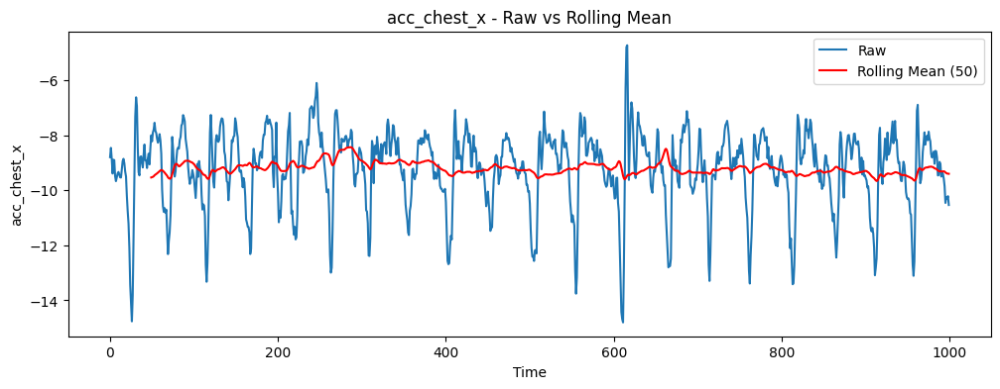

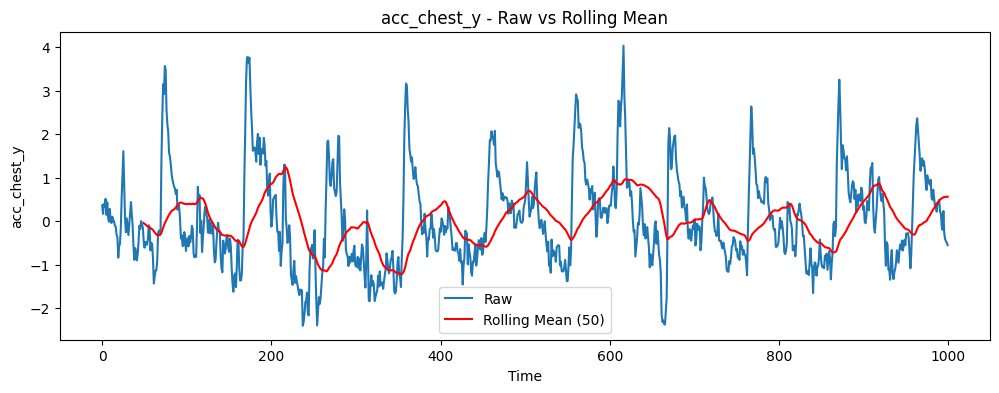

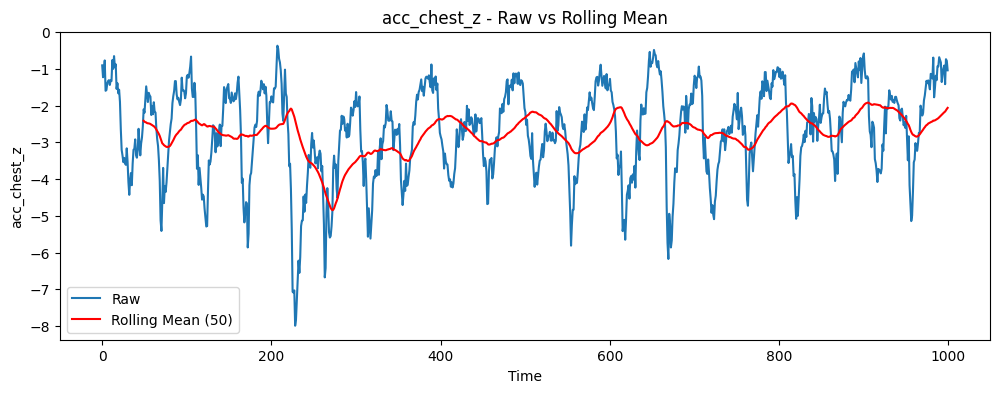

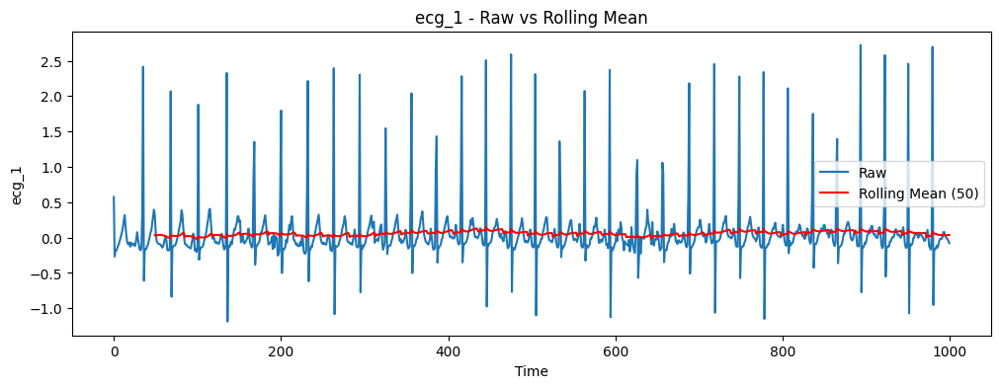

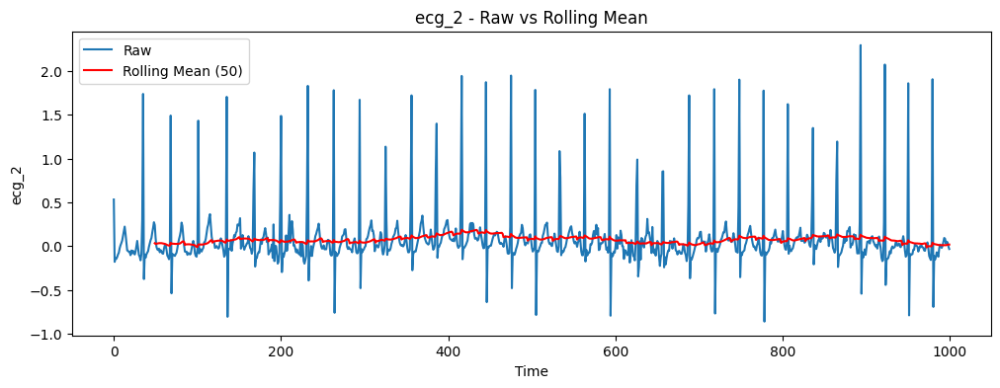

...

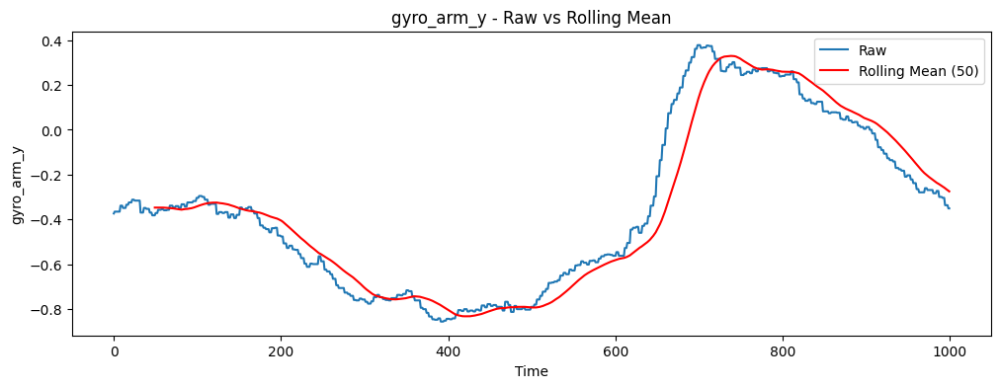

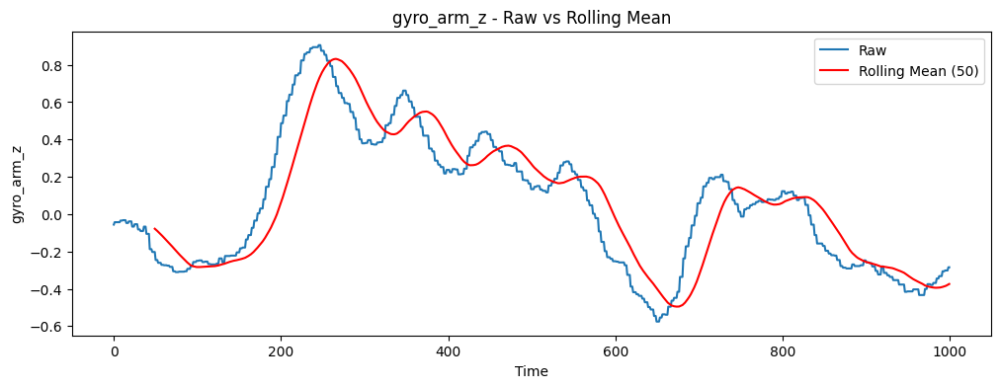

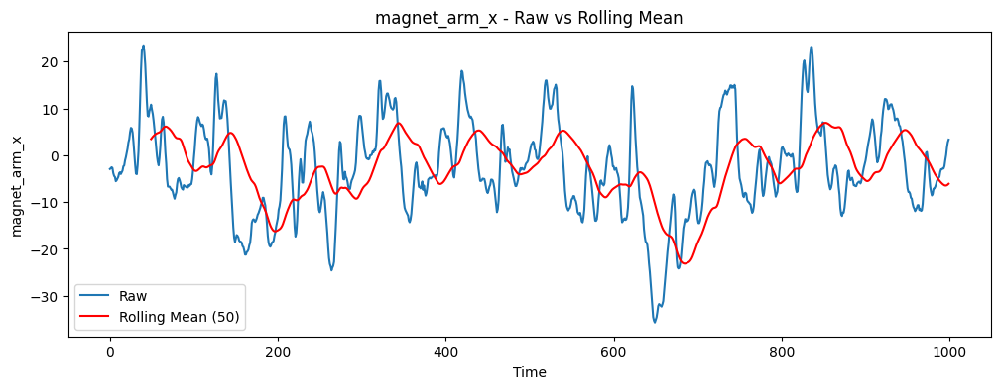

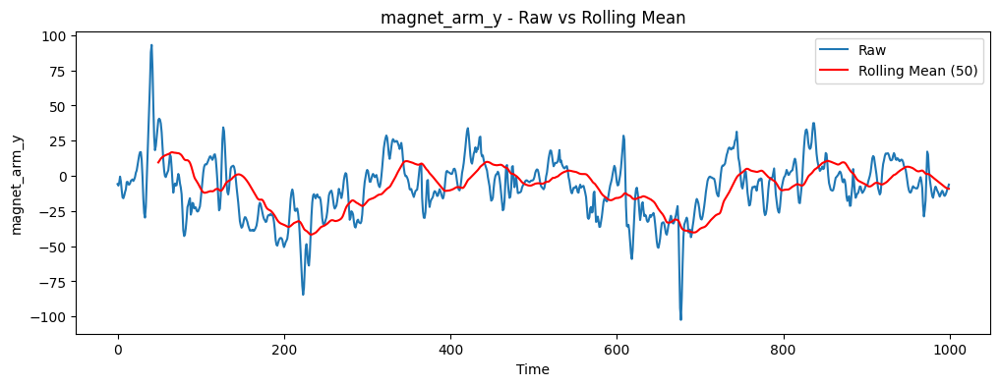

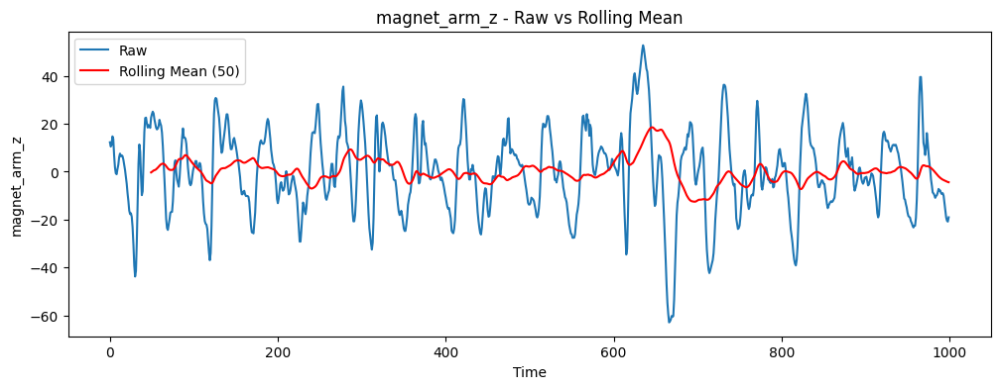

In [81]:
columns = df.columns[:-1]
df_rolling = df[columns].rolling(window=50).mean()
for col in columns:
    plt.figure(figsize=(12, 4))
    plt.plot(df[col][:1000], label='Raw')
    plt.plot(df_rolling[col][:1000], label='Rolling Mean (50)', color='red')
    plt.legend()
    plt.title(f"{col} - Raw vs Rolling Mean")
    plt.xlabel("Time")
    plt.ylabel(col)
    plt.show()


### Skewness and Kurtosis

We measure skewness (asymmetry) and kurtosis (tailedness) for each feature. This helps assess normality and whether transformation might be needed before modeling.


In [82]:
skewed_features = df.drop(columns=['label']).apply(skew)
kurtosis_features = df.drop(columns=['label']).apply(kurtosis)

print("Top 5 Most Skewed Features:")
print(skewed_features.sort_values(ascending=False).head())

print("\nTop 5 Highest Kurtosis Features:")
print(kurtosis_features.sort_values(ascending=False).head())


Top 5 Most Skewed Features:
gyro_ankle_y      1.789124
magnet_ankle_x    0.948247
acc_arm_y         0.872066
gyro_arm_y        0.705137
acc_ankle_y       0.663647
dtype: float64

Top 5 Highest Kurtosis Features:
magnet_ankle_z    42.574784
ecg_2             31.161262
magnet_ankle_y    19.673640
ecg_1             18.307708
magnet_arm_y      12.971271
dtype: float64


### Multivariate Time Series by Label

This section plots multivariate time series data for each label. By selecting a small window of samples from each class, we can visually compare how different sensors behave during different activities.



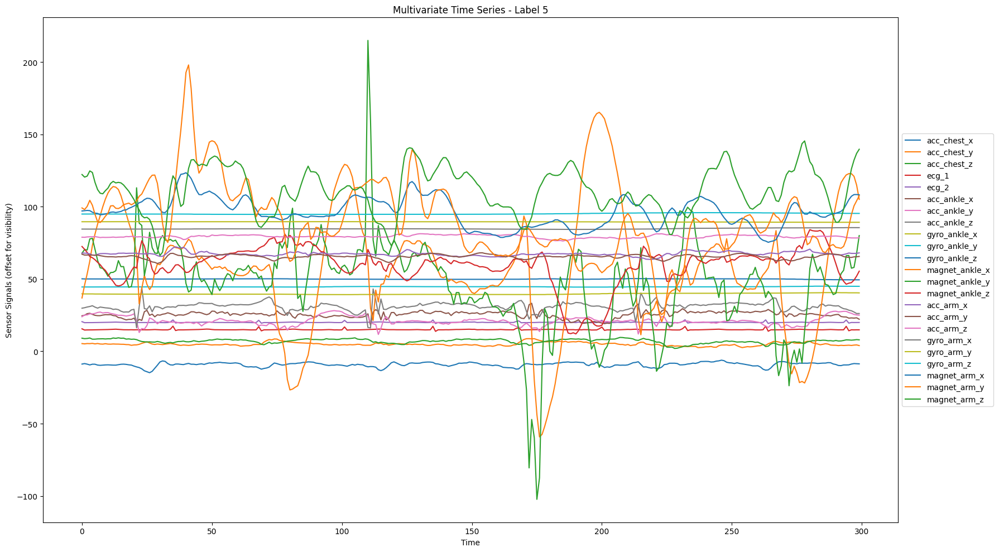

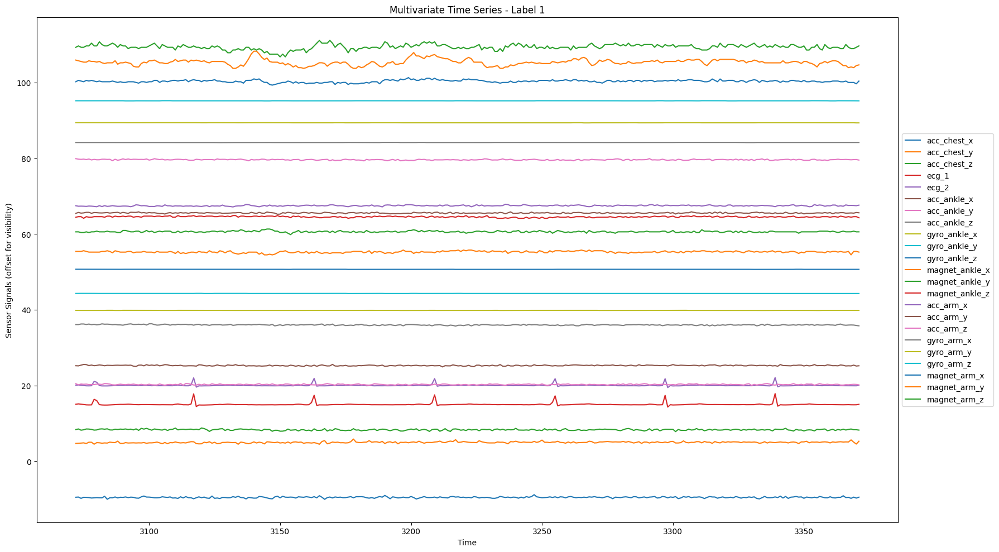

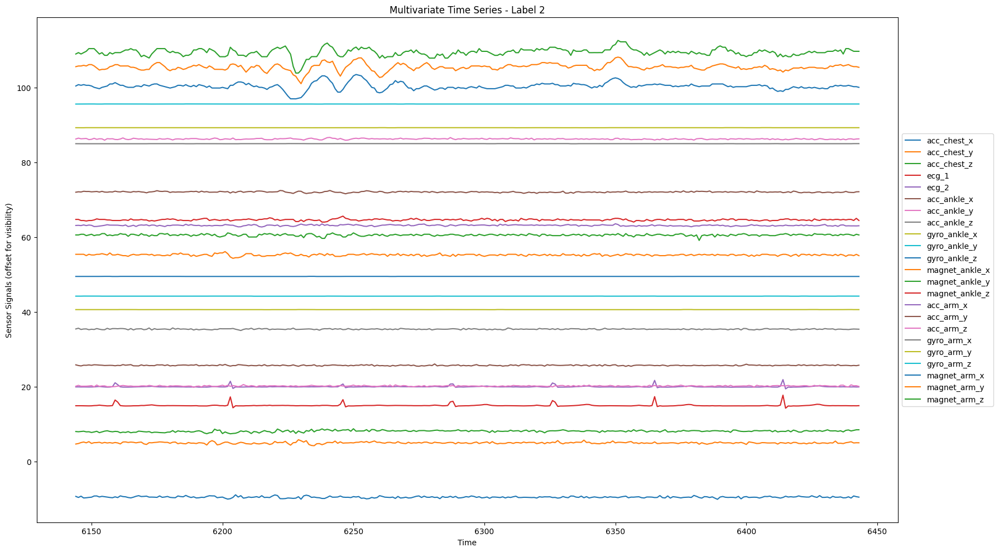

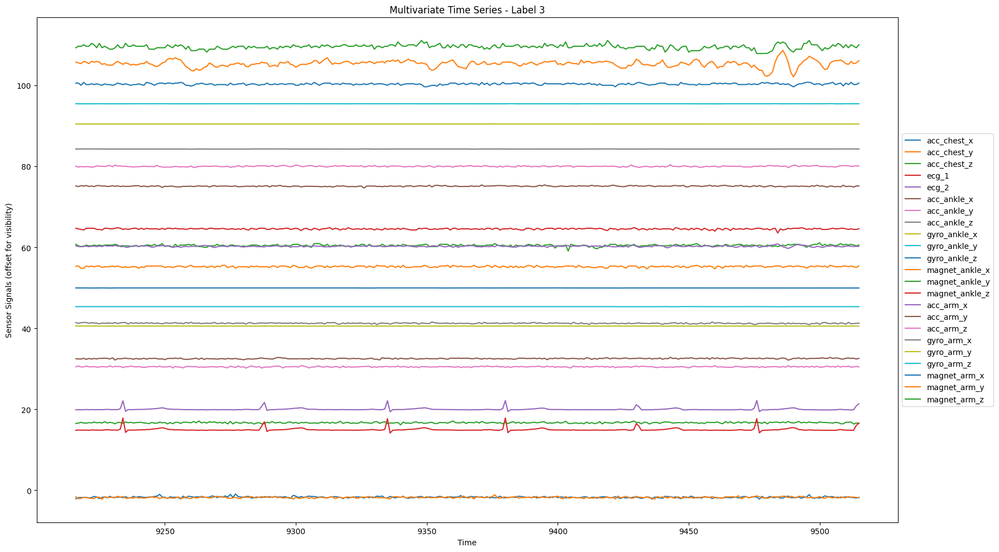

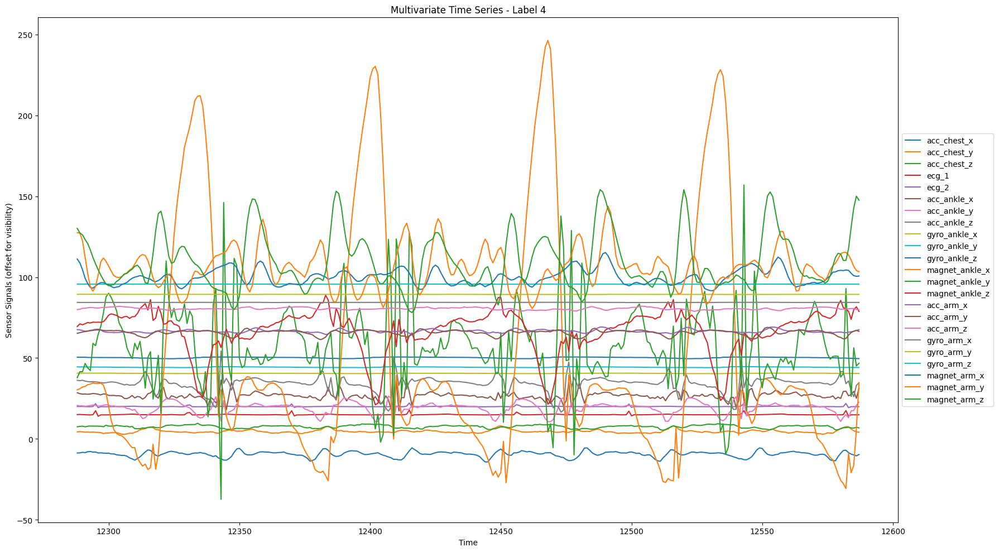

...

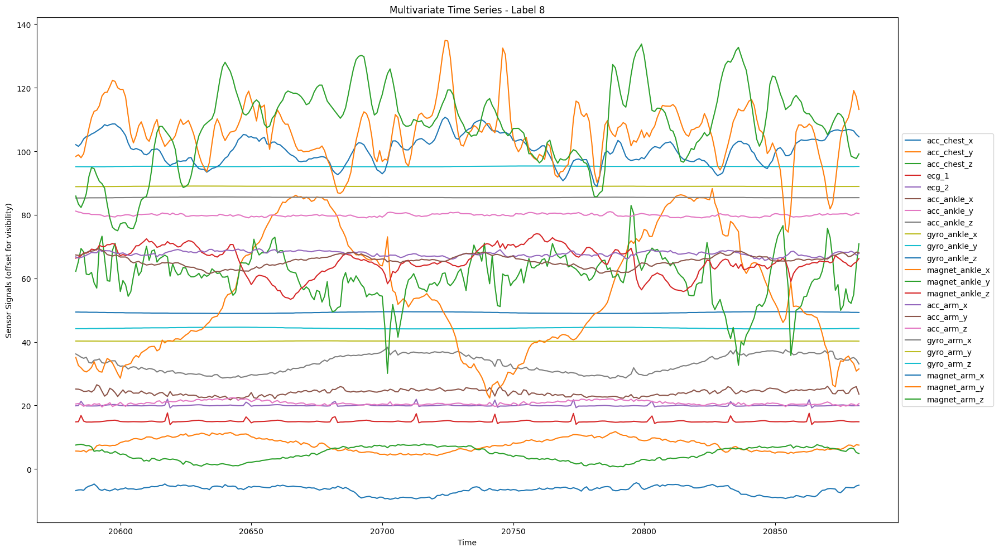

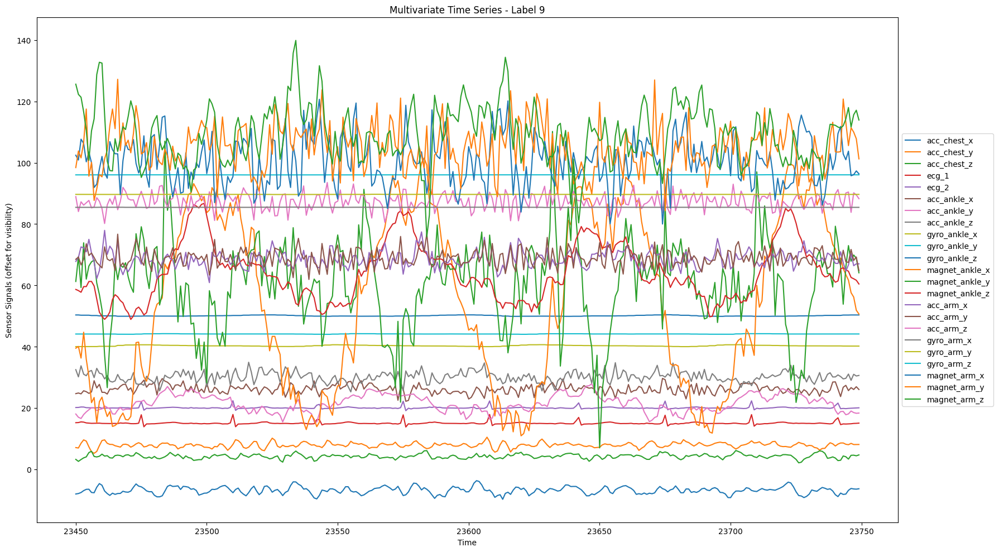

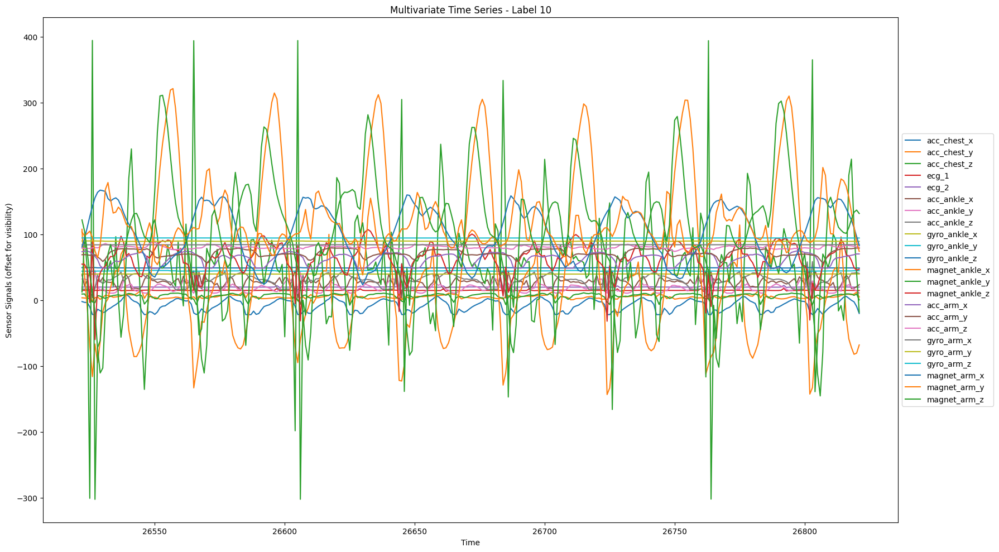

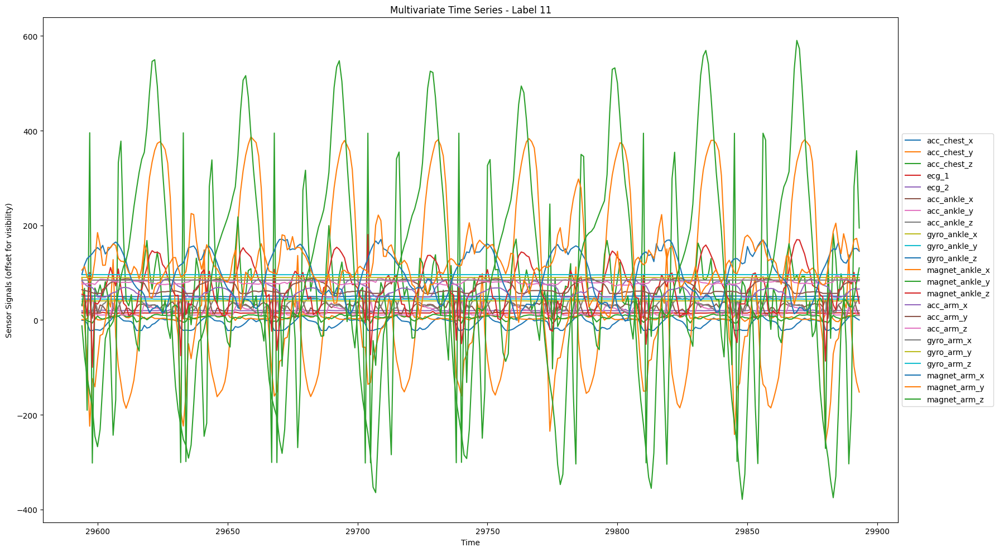

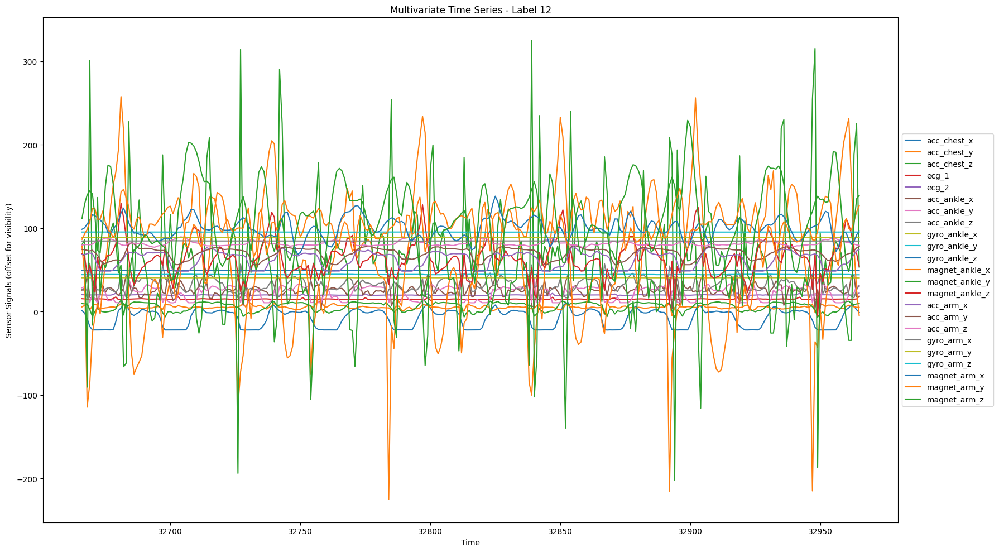

In [83]:

# All sensor columns (excluding label)
sensor_columns = df.columns[:-1]

# Number of data points to visualize per class (you can tweak this)
window_size = 300

# Plot multivariate time series for each label
labels = df['label'].unique()

for label in labels:
    # Filter data for current label
    df_label = df[df['label'] == label].head(window_size)

    plt.figure(figsize=(18, 10))
    for i, col in enumerate(sensor_columns):
        plt.plot(df_label.index, df_label[col] + i * 5, label=col)  # offset for clarity

    plt.title(f"Multivariate Time Series - Label {label}")
    plt.xlabel("Time")
    plt.ylabel("Sensor Signals (offset for visibility)")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()
